SCHELLING MODEL PRIMARY NOTEBOOK

-PROJECT DEFINITION

"American economist Thomas Schelling created an agent-based model that might help explain why segregation is so difficult to combat. His model of segregation showed that even when individuals (or "agents") didn't mind being surrounded or living by agents of a different race, they would still choose to segregate themselves from other agents over time."



ABSTRACT

In the following cells I examined the schelling model of segregation and how certain changes to the standard model would impact the average and total happiness of each kind of piece. I started by creating a model where random unsatisfied pieces were moved to random empty spaces. Despite the randomness, where no piece was moved to a location with any intention other then that it was empty, the two different types of piece still segregated themselves into very easily distinguishable groups. After confirming that my model of the schelling system was working I then examined the effects of altering my model. I did three different tests: changing the ratio of each type of piece at the start of a trial, changing the limit for satisfaction, and changing the "buying power" of each type of piece. As was expected, increasing the initial advantages, being more populus or being "richer", of a piece resulted in that type of piece not only starting happier than the other pieces, but they gained happiness at a quicker rate too. This type of segregation modeling appears to hold close similarities to real life, where certain ethnic groups with more privelage than others will not only start their lives happier than less privelaged groups, but will also be able to increase their happiness at a higher rate.

INTRODUCTION

I created my schelling model where a randomly selected unsatisfied piece would be moved to a randomly selected "empty" space.

I defined satisfaction as the number of like pieces next to a piece, divided by the total number of pieces next to it. This meant that a piece could be unsatisfied even if it is not next to any unlike pieces, simply by virtue of not being next to enough like pieces.

I kept track of the total satisfaction of each piece type, simply adding together all of the decimal satisfactions, as well as the total number of satisfied pieces, by adding all of the pieces that were above the set satisfaction threshold.

I was able to plot the grids showing the different colored pieces, as well as grids showing wether a piece had met the satisfaction critera or not. I also plotted the average satisfaction & number of satisfied pieces versus the number of swapping moves that had occured.

No other notebooks were used in this program. However, my data from all the different trials I ran is saved in the project folder. All of this data is loaded and analyzed at the very bottom of this notebook.

The following articles and websites were consulted as inspiration and help when creating this program:
http://www.pnas.org/content/103/51/19261.full
http://arxiv.org/abs/0903.4694
http://arxiv.org/abs/0707.1681
http://stackoverflow.com
http://numpy.org
http://matplotlib.org
http://ipythonblocks.org


All imports in cell below here.


In [1]:
%matplotlib inline
from ipythonblocks import BlockGrid
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output
from IPython.display import Image

The maketable function creates a square grid that is filled with either a 1,2, or 3 depending on the probability that is selected for each number.

In [2]:
def maketable(x,y,yprob,rprob,bprob):
    table=np.zeros((x,y)) #make a blank table of the given dimensions
    for i in range (len(table)):
        table[i,:]=np.random.choice([1,2,3],x,p=[yprob,rprob,bprob]) #make a row of random number (1,2 and 3) and insert them row by row
    return table



Below is an example of the maketable function working.

In [3]:
table=maketable(5,5,1/3,1/3,1/3)
table2=maketable(5,5,1/2,1/2,0)

print("Table with even chance of all three types of blocks")
print(table)
print("Table with only two types of blocks")
print(table2)

Table with even chance of all three types of blocks
[[ 2.  1.  1.  1.  1.]
 [ 2.  2.  3.  1.  2.]
 [ 1.  2.  3.  1.  3.]
 [ 1.  1.  3.  2.  3.]
 [ 2.  2.  2.  3.  3.]]
Table with only two types of blocks
[[ 2.  2.  1.  1.  1.]
 [ 1.  2.  2.  2.  1.]
 [ 1.  2.  1.  1.  1.]
 [ 2.  2.  2.  2.  1.]
 [ 2.  1.  1.  2.  1.]]


The colorgrid function and satisfaction colorgrid create ipython block grids for the population grid and satisfaction grid, respectively. In the population grid the red and yellow pieces represent the two population types, and the black spaces represent empty blocks. In the satisfaction grid the red pieces are unhappy and the blue pieces are happy.

In [5]:
def colorgrid(table):
    y=0 # counter variables
    x=0
    grid= BlockGrid(len(table),len(table),fill=(200,200,200)) #making a block grid the same size as the given table
    grid.lines_on = True
    grid.block_size = 9
    for y in range (len(table)):  #assigning colors to the blocks based on the number in the 2d array
        while x<len(table):
            if table[y,x]==1:
                grid[y,x]=(200,200,100) #1 is yellow
            if table[y,x]==2:
                grid[y,x]=(200,0,0) #2 is red
            if table[y,x]==3:
                grid[y,x]=(0,0,0) #3 is Black
            x=x+1
        x=0
    return grid
        


Below is an example of the colorgrid function working on the two different tables from above.

In [6]:
print(table)
display(colorgrid(table))
print(table2)
display(colorgrid(table2))

[[ 2.  1.  1.  1.  1.]
 [ 2.  2.  3.  1.  2.]
 [ 1.  2.  3.  1.  3.]
 [ 1.  1.  3.  2.  3.]
 [ 2.  2.  2.  3.  3.]]


,,,,
,,,,
,,,,
,,,,
,,,,


[[ 2.  2.  1.  1.  1.]
 [ 1.  2.  2.  2.  1.]
 [ 1.  2.  1.  1.  1.]
 [ 2.  2.  2.  2.  1.]
 [ 2.  1.  1.  2.  1.]]


,,,,
,,,,
,,,,
,,,,
,,,,


The satisfaction colorgrid function makes a colorgrid based on the satisfaction table.

In [7]:
def satisfactioncolorgrid(table):
    y=0 # counter variables
    x=0
    grid= BlockGrid(len(table),len(table),fill=(200,200,200)) #making a block grid the same size as the given table
    grid.lines_on = True
    grid.block_size = 9
    for y in range (len(table)):  #assigning colors to the blocks based on the number in the 2d array
        while x<len(table):
            if table[y,x]<0.3:
                grid[y,x]=(200,0,0) #red is unhappy peace
            if table[y,x]>0.3 and table[y,x]<1.1:
                grid[y,x]=(0,200,200) # blue is a happy piece
            if table[y,x]==2:
                grid[y,x]=(0,0,0) #white is blank spacce
            x=x+1
        x=0
    return grid



The get satisfaction function is the main workhorse of the make satisfaction table function.

In [8]:
def getsatisfaction(near,table,i,j):
    happy,sad=0,0
    piece_type=0
    for value in near:
        if value==3:
            happy=happy
            sad=sad
        if value==table[i,j]:
            happy=happy+1        
        elif value!= table[i,j] and i!= 3.0:
            sad=sad+1
        satisfaction=happy/len(near)
        if table[i,j]==3:
            satisfaction=2
    if table[i,j]==1:
        #make it so it returns yellow pieces happiness
        piece_type=1
    if table[i,j]==2:
        #make it so it returns black pieces happiness
        piece_type=2
    if table[i,j]==3:
        #make it so it returns that black piece
        piece_type=3
    return satisfaction,piece_type

The make satisfactiontable works on two parts. The "near" arrays represent what squares are next to each block and then there is a for loop that determines the satisfaction of each block in its area.

In [3]:
def makesatisfactiontable(table):
    satisfactiontable=np.zeros((len(table),len(table)))
    yellow_happiness,yellow_count=0,0
    red_happiness,red_count=0,0
    black_pieces=0
    for i in range(len(table)): 
        for j in range(len(table)):
            if i>0 and i<len(table)-1 and j>0 and j<len(table)-1:#middle squares
                near=[table[i-1,j],table[i+1,j],table[i,j-1],table[i,j+1],table[i-1,j-1],table[i-1,j+1],table[i+1,j-1],table[i+1,j+1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1


            if i==0 and j<len(table)-1 and j>0: #top row (no corners)
                near=[table[i+1,j],table[i,j-1],table[i,j+1],table[i+1,j+1],table[i+1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]            
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1

                
            if i==len(table)-1 and j<len(table)-1 and j>0: # bottom row (no corners)
                near=[table[i-1,j],table[i,j-1],table[i,j+1],table[i-1,j+1],table[i-1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]                      
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1
           
                
            if j==0 and i<len(table)-1 and i>0: #left column no corners
                near=[table[i+1,j],table[i-1,j],table[i,j+1],table[i-1,j+1],table[i+1,j+1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]               
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1

                
            if j==len(table)-1 and i<len(table)-1 and i>0: #right column no corners
                near=[table[i-1,j],table[i+1,j],table[i,j-1],table[i-1,j-1],table[i+1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]             
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1

                
            if i==0 and j==0: #top left corner
                near=[table[i+1,j],table[i,j+1],table[i+1,j+1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]            
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1


            if i==len(table)-1 and j==0: #bottom left corner
                near=[table[i-1,j],table[i,j+1],table[i-1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]              
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1
              
                
            if i==len(table)-1 and j==len(table)-1: #bottom right corner
                near=[table[i-1,j],table[i,j-1],table[i-1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]               
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1
                

            if i==0 and j==len(table)-1: #top right corner
                near=[table[i+1,j],table[i,j-1],table[i+1,j-1]]
                for value in near:
                    satisfaction=getsatisfaction(near,table,i,j)
                satisfactiontable[i,j]=satisfaction[0]                
                if satisfaction[1]==1:
                    yellow_happiness=yellow_happiness+satisfaction[0]
                    yellow_count=yellow_count+1
                if satisfaction[1]==2:
                    red_happiness=red_happiness+satisfaction[0]
                    red_count=red_count+1
                if satisfaction[1]==3:
                    black_pieces=black_pieces+1
                    red_count=red_count+1
                
                
    return satisfactiontable



Below is an example of the two colorgrid functions working and the satisfactino grid function working.

In [10]:
stable=makesatisfactiontable(table)
print(table)
print(stable)
display(colorgrid(table))
display(satisfactioncolorgrid(stable))

[[ 2.  1.  1.  1.  1.]
 [ 2.  2.  3.  1.  2.]
 [ 1.  2.  3.  1.  3.]
 [ 1.  1.  3.  2.  3.]
 [ 2.  2.  2.  3.  3.]]
[[ 0.66666667  0.2         0.6         0.6         0.66666667]
 [ 0.6         0.375       2.          0.5         0.        ]
 [ 0.4         0.25        2.          0.125       2.        ]
 [ 0.4         0.25        2.          0.125       2.        ]
 [ 0.33333333  0.4         0.4         2.          2.        ]]


,,,,
,,,,
,,,,
,,,,
,,,,


,,,,
,,,,
,,,,
,,,,
,,,,


Stable stats function returns all the information to be analyzed about the table and the satisfaction table.

In [11]:
def stable_stats(table,stable):
    yellow_happiness,yellow_count,sat_yellows=0,0,0
    red_happiness,red_count,sat_reds=0,0,0
    black_pieces=0
    i,j=0,0
    for i in range(len(table)):
        while j<len(table):
            satisfaction=stable[i,j]
            if table[i,j]==1:
                yellow_happiness=yellow_happiness+satisfaction
                yellow_count=yellow_count+1
                if satisfaction>0.3:
                    sat_yellows=sat_yellows+1
            if table[i,j]==2:
                red_happiness=red_happiness+satisfaction
                red_count=red_count+1
                if satisfaction>0.3:
                    sat_reds=sat_reds+1
            if table[i,j]==3:
                black_pieces=black_pieces+1
            j=j+1
        j=0
    return yellow_happiness,yellow_count,red_happiness,red_count,black_pieces,sat_yellows,sat_reds
        

The findunsatisfied function and the findempty work by looking for an empty or unsatisfied square in either the table or satisfactiontable.

In this functino you can change both the satisfaction tolerance as well as the likelihood of each type of piece being allowed to move, its "buying power".


In [4]:
def findunsatisfied(stable,table):
    i,j=np.random.random_integers(0, len(stable)-1, 1), np.random.random_integers(0, len(stable)-1, 1)
    z=[0]
    x=0
    for x in range(len(stable)**2):
        z[0]=np.random.choice([1,2],1,p=[1/2,1/2]) #yellow then red, making it so yellow is twice as likely to get picked
        if stable[i,j]<0.3 and table[i,j]==z[0]:
            return i, j, stable[i,j]
        else:
            i,j=np.random.random_integers(0, len(stable)-1, 1),np.random.random_integers(0, len(stable)-1, 1)
            x=x+1



In [13]:
def findempty(table):
    i,j=np.random.random_integers(0, len(table)-1, 1), np.random.random_integers(0, len(table)-1, 1)
    x=0
    for x in range(len(table)**2):
        if table[i,j]==3:
            return i, j, table[i,j]
        else:
            i,j=np.random.random_integers(0, len(table)-1, 1),np.random.random_integers(0, len(table)-1, 1)
            x=x+1 


The swap function is the heart of the program right now. It starts by finding an unsatisfied point in the satisfactiontable and gathering its location and value. Then it finds an empty point in the values table and records its location. It then makes the location of the empty value the value of the unsatisfied value. Finally it makes the previous location of the unsatisfied value, a blank one.

In [14]:
def swap(table,stable):
    moving_value=findunsatisfied(stable,table)
    sadx=moving_value[1]
    sady=moving_value[0]
    empty_value=findempty(table)
    blankx=empty_value[1]
    blanky=empty_value[0]
    table[blanky,blankx]=table[sady,sadx]
    table[sady,sadx]=3
    newtable=table
    newsattable=makesatisfactiontable(table)
    return newtable, newsattable
    

Run the tables below for an example of the code segregating the red and yellow blocks.

In [15]:
table=maketable(50,50,1/3,1/3,1/3)
stable=makesatisfactiontable(table)

display(colorgrid(table))
display(satisfactioncolorgrid(stable))

stable_statistics=np.zeros((10,7))


# for i in range(1000):
#     interim=swap(table,stable)
#     table=interim[0]
#     stable=interim[1]
#     if i==1:
#         stable_statistics[0,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying1",table,stable)
#     if i==100:
#         stable_statistics[1,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying100",table,stable)
#     if i==200:
#         stable_statistics[2,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying200",table,stable)
#     if i==300:
#         stable_statistics[3,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying300",table,stable)
#     if i==400:
#         stable_statistics[4,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying400",table,stable)
#     if i==500:
#         stable_statistics[5,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying500",table,stable)
#     if i==600:
#         stable_statistics[6,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying600",table,stable)
#     if i==700:
#         stable_statistics[7,:]=stable_stats(table,stable) 
#         np.savez("Even_Yellow_Buying700",table,stable)
#     if i==800:
#         stable_statistics[8,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying800",table,stable)
#     if i==999:
#         stable_statistics[9,:]=stable_stats(table,stable)
#         np.savez("Even_Yellow_Buying999",table,stable)


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


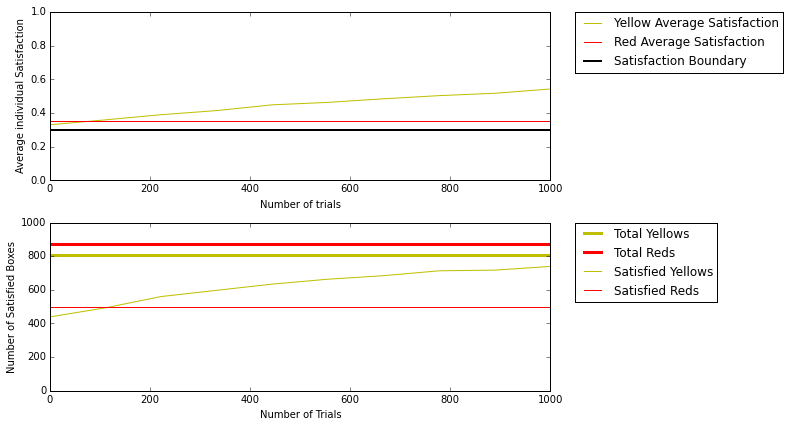

In [44]:
yellow_average=np.zeros((10,1))
red_average=np.zeros((10,1))
yellow_sats=np.zeros((10,1))
red_satis=np.zeros((10,1))
t = np.linspace(0, 1000.0, 10)
for i in range(10):
    yellow_average[i]=stable_statistics_buy03[i,0]/stable_statistics_buy03[i,1]
    red_average[i]=stable_statistics_buy03[i,2]/stable_statistics_buy03[i,3]
    yellow_sats[i]=stable_statistics_buy03[i,5]
    red_satis[i]=stable_statistics_buy03[i,6]
y=np.transpose(yellow_average)    


f=plt.figure(figsize=(8,6))
plt.subplot(2,1,1)
plt.plot(t,yellow_average,label="Yellow Average Satisfaction", color="y")
plt.plot(t,red_average, label="Red Average Satisfaction", color="r")
plt. plot([0, 1000], [0.3, 0.3], color='k', linestyle='-', linewidth=2,label="Satisfaction Boundary")
plt.xlim(0,1000)
plt.ylim(0,1)
plt.xlabel("Number of trials")
plt.ylabel("Average individual Satisfaction")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.subplot(2,1,2)
plt. plot([0, 1000], [808, 808], color='y', linestyle='-', linewidth=3,label="Total Yellows")
plt. plot([0, 1000], [871, 871], color='r', linestyle='-', linewidth=3,label="Total Reds")
plt.plot(t,yellow_sats,label="Satisfied Yellows",color='y')
plt.plot(t,red_satis,label="Satisfied Reds",color="r")
plt.ylabel("Number of Satisfied Boxes")
plt.xlabel("Number of Trials")
plt.xlim(0,1000)
plt.ylim(0,1000)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig("Plot Where Yellow Has All Buying Power")

DEMONSTRATIONS OCCUR BELOW BASED OFF OF DATA THAT WAS COLLECTED IN PREVIOUS TRIALS
-ALL GRAPHS AND VISUALIZATIONS MADE USING ABOVE CODE THAT WAS MODIFIED ON A CASE BY CASE BASIS
INFORMATION SAVED AND LOADED AT BOTTOM OF NOTEBOOK

In [43]:
print("Even black, yellow, red. Satisfaction level set at 0.3")
print("")
print("Original Grids")
display(colorgrid(even1['arr_0']),satisfactioncolorgrid(even1['arr_1']))


Even black, yellow, red. Satisfaction level set at 0.3

Original Grids


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [24]:
print("Grids after 300 moves")
display(colorgrid(even3['arr_0']),satisfactioncolorgrid(even3['arr_1']))


Grids after 300 moves


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [25]:
print("Grids after 600 moves")
display(colorgrid(even6['arr_0']),satisfactioncolorgrid(even6['arr_1']))


Grids after 600 moves


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [26]:
print("Grids after 1000 moves")
display(colorgrid(even10['arr_0']),satisfactioncolorgrid(even10['arr_1']))

Grids after 1000 moves


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


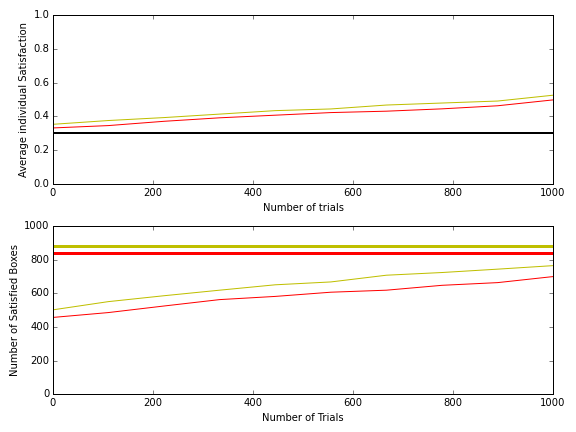

In [27]:
i = Image(filename='Plots with all squares even.png')
display(i)

In [28]:
print("First and final grids where the majority of pieces are yellow after 1000 rounds of swapping")
display(colorgrid(halfquarter1['arr_0']),satisfactioncolorgrid(halfquarter1['arr_1']))
display(colorgrid(halfquarter10['arr_0']),satisfactioncolorgrid(halfquarter10['arr_1']))

First and final grids where the majority of pieces are yellow after 1000 rounds of swapping


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


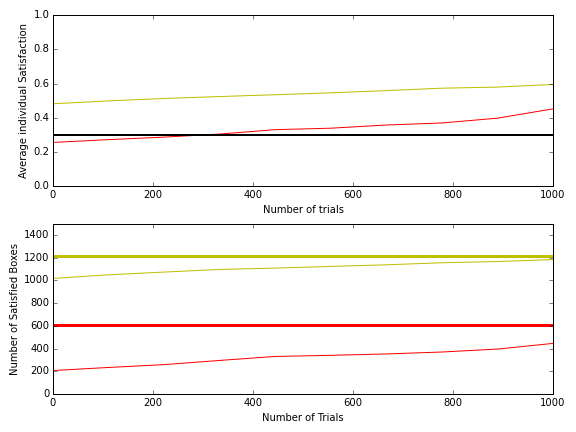

In [29]:
b = Image(filename='Plots with more yellows than reds.png')
display(b)

In [30]:
print("Grids showing behavior when there are fewer empty spaces than either yellow or red ones")
display(colorgrid(fewempty1['arr_0']),satisfactioncolorgrid(fewempty1['arr_1']))
display(colorgrid(fewempty10['arr_0']),satisfactioncolorgrid(fewempty10['arr_1']))

Grids showing behavior when there are fewer empty spaces than either yellow or red ones


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


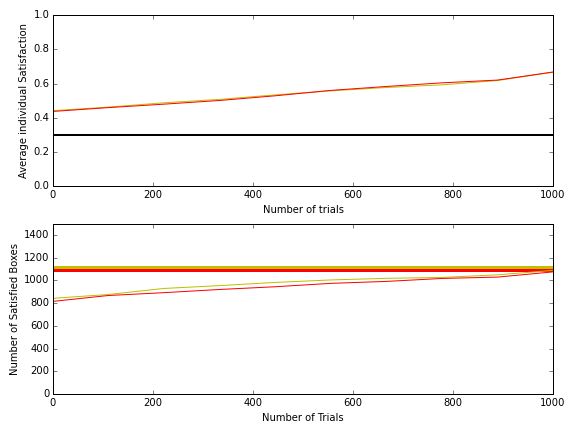

In [6]:
d = Image(filename='Plots with Few Empties and Even Reds and Yellows.png')
display(d)

In [32]:
print("Grids showing when there are few empty pieces and the number of red and yellows is uneven")
display(colorgrid(fewemptyuneven1['arr_0']),satisfactioncolorgrid(fewemptyuneven1['arr_1']))
display(colorgrid(fewemptyuneven10['arr_0']),satisfactioncolorgrid(fewemptyuneven10['arr_1']))

Grids showing when there are few empty pieces and the number of red and yellows is uneven


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


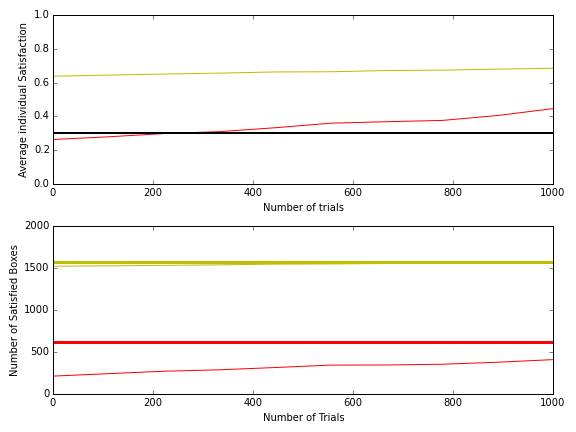

In [33]:
c = Image(filename='Plots With Few Empties and Uneven Yellow and Reds.png')
display(c)

In [34]:
print("Grids displaying what happens when most of the grids are empty and the number of reds and yellows is even")
display(colorgrid(halfempty1['arr_0']),satisfactioncolorgrid(halfempty1['arr_1']))
display(colorgrid(halfempty10['arr_0']),satisfactioncolorgrid(halfempty10['arr_1']))

Grids displaying what happens when most of the grids are empty and the number of reds and yellows is even


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


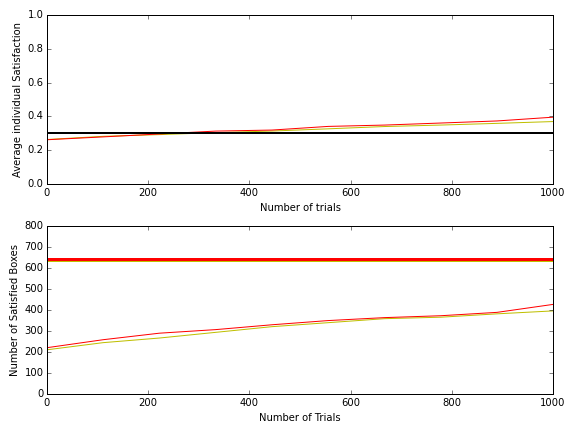

In [35]:
e = Image(filename='Plots with lots of empties and even colors.png')
display(e)

Grids displaying what occurs when the satisfaction limit is raised form 0.3 to 0.5

In [47]:
display(colorgrid(evensat051['arr_0']),satisfactioncolorgrid(evensat051['arr_1']))
display(colorgrid(evensat0510['arr_0']),satisfactioncolorgrid(evensat0510['arr_1']))

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


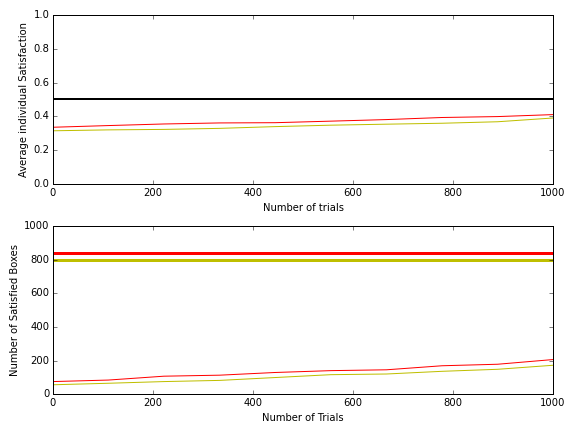

In [48]:
f = Image(filename='Plots with Sat Limit at half.png')
display(f)

In [49]:
print("Grids displaying what occurs when the satisfaction limit is raised form 0.3 to 0.6 AND the number of swaps was doubled")
display(colorgrid(evensat06long1['arr_0']),satisfactioncolorgrid(evensat06long1['arr_1']))
display(colorgrid(evensat06long10['arr_0']),satisfactioncolorgrid(evensat06long10['arr_1']))

Grids displaying what occurs when the satisfaction limit is raised form 0.3 to 0.6 AND the number of swaps was doubled


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


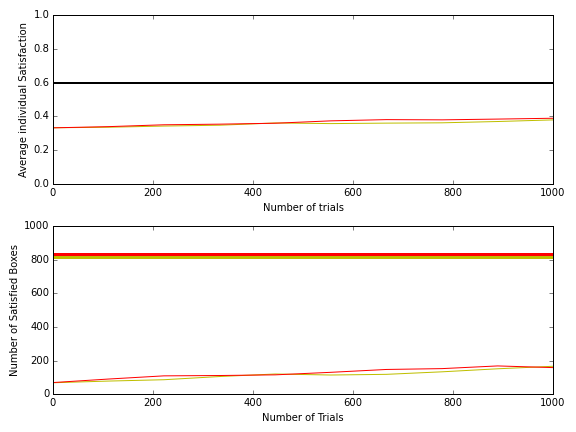

In [50]:
f = Image(filename='Plots with Sat Limit at Point Six Long Trial.png')
display(f)

In [51]:
print("Grids when yellow pieces have twice as much 'buying power' as reds")
display(colorgrid(buyingpower1_3_1['arr_0']),satisfactioncolorgrid(buyingpower1_3_1['arr_1']))
display(colorgrid(buyingpower1_3_10['arr_0']),satisfactioncolorgrid(buyingpower1_3_10['arr_1']))

Grids when yellow pieces have twice as much 'buying power' as reds


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


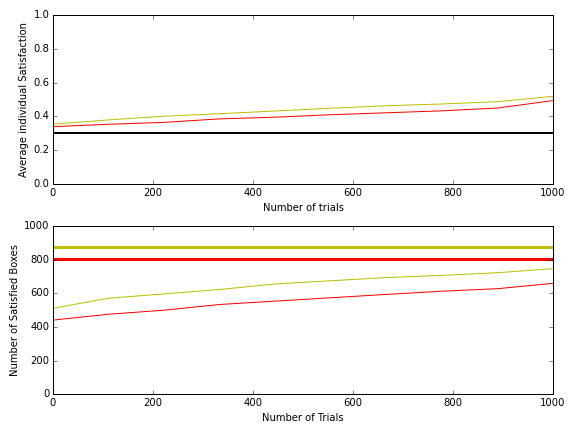

In [67]:
f = Image(filename='Plots with Yellow Twice Buying Power.png')
display(f)

In [52]:
print("Grids where yellow has all the 'buying power' ")
display(colorgrid(buyingpower3_3_1['arr_0']),satisfactioncolorgrid(buyingpower3_3_1['arr_1']))
display(colorgrid(buyingpower3_3_10['arr_0']),satisfactioncolorgrid(buyingpower3_3_10['arr_1']))

Grids where yellow has all the 'buying power' 


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


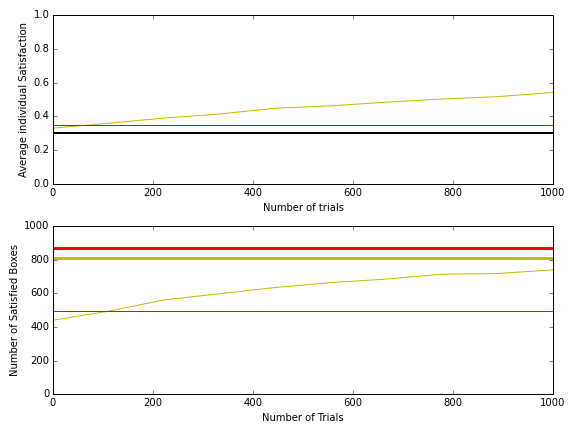

In [71]:
h = Image(filename='Plot Where Yellow Has All Buying Power.png')
display(h)

For final plot change satcolorgrid satisfaction to (.601,.602) then play the next box.



In [80]:
display(colorgrid(fewempty1['arr_0']),satisfactioncolorgrid(fewempty1['arr_1']))
display(colorgrid(fewempty10['arr_0']),satisfactioncolorgrid(fewempty10['arr_1']))

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [17]:
even1=np.load("Even.Even1.npz")
even2=np.load("Even.Even100.npz")
even3=np.load("Even.Even200.npz")
even4=np.load("Even.Even300.npz")
even5=np.load("Even.Even400.npz")
even6=np.load("Even.Even500.npz")
even7=np.load("Even.Even600.npz")
even8=np.load("Even.Even700.npz")
even9=np.load("Even.Even800.npz")
even10=np.load("Even.Even999.npz")

halfquarter1=np.load("Half.Quarter1.npz")
halfquarter2=np.load("Half.Quarter100.npz")
halfquarter3=np.load("Half.Quarter200.npz")
halfquarter4=np.load("Half.Quarter300.npz")
halfquarter5=np.load("Half.Quarter400.npz")
halfquarter6=np.load("Half.Quarter500.npz")
halfquarter7=np.load("Half.Quarter600.npz")
halfquarter8=np.load("Half.Quarter700.npz")
halfquarter9=np.load("Half.Quarter800.npz")
halfquarter10=np.load("Half.Quarter999.npz")

halfempty1=np.load("Half.Empty1.npz")
halfempty2=np.load("Half.Empty100.npz")
halfempty3=np.load("Half.Empty200.npz")
halfempty4=np.load("Half.Empty300.npz")
halfempty5=np.load("Half.Empty400.npz")
halfempty6=np.load("Half.Empty500.npz")
halfempty7=np.load("Half.Empty600.npz")
halfempty8=np.load("Half.Empty700.npz")
halfempty9=np.load("Half.Empty800.npz")
halfempty10=np.load("Half.Empty999.npz")

fewempty1=np.load("Few.Empty1.npz")
fewempty2=np.load("Few.Empty100.npz")
fewempty3=np.load("Few.Empty200.npz")
fewempty4=np.load("Few.Empty300.npz")
fewempty5=np.load("Few.Empty400.npz")
fewempty6=np.load("Few.Empty500.npz")
fewempty7=np.load("Few.Empty600.npz")
fewempty8=np.load("Few.Empty700.npz")
fewempty9=np.load("Few.Empty800.npz")
fewempty10=np.load("Few.Empty999.npz")

fewemptyuneven1=np.load("Few.Empty.Uneven1.npz")
fewemptyuneven2=np.load("Few.Empty.Uneven100.npz")
fewemptyuneven3=np.load("Few.Empty.Uneven200.npz")
fewemptyuneven4=np.load("Few.Empty.Uneven300.npz")
fewemptyuneven5=np.load("Few.Empty.Uneven400.npz")
fewemptyuneven6=np.load("Few.Empty.Uneven500.npz")
fewemptyuneven7=np.load("Few.Empty.Uneven600.npz")
fewemptyuneven8=np.load("Few.Empty.Uneven700.npz")
fewemptyuneven9=np.load("Few.Empty.Uneven800.npz")
fewemptyuneven10=np.load("Few.Empty.Uneven999.npz")

In [18]:
evensat051=np.load("Sat_05_Even1.npz")
evensat052=np.load("Sat_05_Even100.npz")
evensat053=np.load("Sat_05_Even200.npz")
evensat054=np.load("Sat_05_Even300.npz")
evensat055=np.load("Sat_05_Even400.npz")
evensat056=np.load("Sat_05_Even500.npz")
evensat057=np.load("Sat_05_Even600.npz")
evensat058=np.load("Sat_05_Even700.npz")
evensat059=np.load("Sat_05_Even800.npz")
evensat0510=np.load("Sat_05_Even999.npz")

evensat061=np.load("Sat_06_Even1.npz")
evensat062=np.load("Sat_06_Even100.npz")
evensat063=np.load("Sat_06_Even200.npz")
evensat064=np.load("Sat_06_Even300.npz")
evensat065=np.load("Sat_06_Even400.npz")
evensat066=np.load("Sat_06_Even500.npz")
evensat067=np.load("Sat_06_Even600.npz")
evensat068=np.load("Sat_06_Even700.npz")
evensat069=np.load("Sat_06_Even800.npz")
evensat0610=np.load("Sat_06_Even999.npz")

evensat06long1=np.load("Sat_06_Evenlong1.npz")
evensat06long2=np.load("Sat_06_Evenlong100.npz")
evensat06long3=np.load("Sat_06_Evenlong200.npz")
evensat06long4=np.load("Sat_06_Evenlong300.npz")
evensat06long5=np.load("Sat_06_Evenlong400.npz")
evensat06long6=np.load("Sat_06_Evenlong500.npz")
evensat06long7=np.load("Sat_06_Evenlong600.npz")
evensat06long8=np.load("Sat_06_Evenlong700.npz")
evensat06long9=np.load("Sat_06_Evenlong800.npz")
evensat06long10=np.load("Sat_06_Evenlong999.npz")

In [19]:
buyingpower1_3_1=np.load("Even_Yellow_Buying1.npz")
buyingpower1_3_2=np.load("Even_Yellow_Buying100.npz")
buyingpower1_3_3=np.load("Even_Yellow_Buying200.npz")
buyingpower1_3_4=np.load("Even_Yellow_Buying300.npz")
buyingpower1_3_5=np.load("Even_Yellow_Buying400.npz")
buyingpower1_3_6=np.load("Even_Yellow_Buying500.npz")
buyingpower1_3_7=np.load("Even_Yellow_Buying600.npz")
buyingpower1_3_8=np.load("Even_Yellow_Buying700.npz")
buyingpower1_3_9=np.load("Even_Yellow_Buying800.npz")
buyingpower1_3_10=np.load("Even_Yellow_Buying999.npz")

buyingpower2_3_1=np.load("Even_Yellow_90Buying1.npz")
buyingpower2_3_2=np.load("Even_Yellow_90Buying100.npz")
buyingpower2_3_3=np.load("Even_Yellow_90Buying200.npz")
buyingpower2_3_4=np.load("Even_Yellow_90Buying300.npz")
buyingpower2_3_5=np.load("Even_Yellow_90Buying400.npz")
buyingpower2_3_6=np.load("Even_Yellow_90Buying500.npz")
buyingpower2_3_7=np.load("Even_Yellow_90Buying600.npz")
buyingpower2_3_8=np.load("Even_Yellow_90Buying700.npz")
buyingpower2_3_9=np.load("Even_Yellow_90Buying800.npz")
buyingpower2_3_10=np.load("Even_Yellow_90Buying999.npz")

buyingpower3_3_1=np.load('Even_Yellow_AllBuying1.npz')
buyingpower3_3_2=np.load('Even_Yellow_AllBuying100.npz')
buyingpower3_3_3=np.load('Even_Yellow_AllBuying200.npz')
buyingpower3_3_4=np.load('Even_Yellow_AllBuying300.npz')
buyingpower3_3_5=np.load('Even_Yellow_AllBuying400.npz')
buyingpower3_3_6=np.load('Even_Yellow_AllBuying500.npz')
buyingpower3_3_7=np.load('Even_Yellow_AllBuying600.npz')
buyingpower3_3_8=np.load('Even_Yellow_AllBuying700.npz')
buyingpower3_3_9=np.load('Even_Yellow_AllBuying800.npz')
buyingpower3_3_10=np.load('Even_Yellow_AllBuying999.npz')

In [20]:
stable_statistics_even=np.zeros((10,7))
stable_statistics_halfq=np.zeros((10,7))
stable_statistics_halfe=np.zeros((10,7))
stable_statistics_fewe=np.zeros((10,7))
stable_statistics_fewe_e=np.zeros((10,7))

stable_statistics_even[0,:]=stable_stats(even1['arr_0'],even1['arr_1'])
stable_statistics_even[1,:]=stable_stats(even2['arr_0'],even2['arr_1'])
stable_statistics_even[2,:]=stable_stats(even3['arr_0'],even3['arr_1'])
stable_statistics_even[3,:]=stable_stats(even4['arr_0'],even4['arr_1'])
stable_statistics_even[4,:]=stable_stats(even5['arr_0'],even5['arr_1'])
stable_statistics_even[5,:]=stable_stats(even6['arr_0'],even6['arr_1'])
stable_statistics_even[6,:]=stable_stats(even7['arr_0'],even7['arr_1'])
stable_statistics_even[7,:]=stable_stats(even8['arr_0'],even8['arr_1'])
stable_statistics_even[8,:]=stable_stats(even9['arr_0'],even9['arr_1'])
stable_statistics_even[9,:]=stable_stats(even10['arr_0'],even10['arr_1'])

stable_statistics_halfq[0,:]=stable_stats(halfquarter1['arr_0'],halfquarter1['arr_1'])
stable_statistics_halfq[1,:]=stable_stats(halfquarter2['arr_0'],halfquarter2['arr_1'])
stable_statistics_halfq[2,:]=stable_stats(halfquarter3['arr_0'],halfquarter3['arr_1'])
stable_statistics_halfq[3,:]=stable_stats(halfquarter4['arr_0'],halfquarter4['arr_1'])
stable_statistics_halfq[4,:]=stable_stats(halfquarter5['arr_0'],halfquarter5['arr_1'])
stable_statistics_halfq[5,:]=stable_stats(halfquarter6['arr_0'],halfquarter6['arr_1'])
stable_statistics_halfq[6,:]=stable_stats(halfquarter7['arr_0'],halfquarter7['arr_1'])
stable_statistics_halfq[7,:]=stable_stats(halfquarter8['arr_0'],halfquarter8['arr_1'])
stable_statistics_halfq[8,:]=stable_stats(halfquarter9['arr_0'],halfquarter9['arr_1'])
stable_statistics_halfq[9,:]=stable_stats(halfquarter10['arr_0'],halfquarter10['arr_1'])

stable_statistics_halfe[0,:]=stable_stats(halfempty1['arr_0'],halfempty1['arr_1'])
stable_statistics_halfe[1,:]=stable_stats(halfempty2['arr_0'],halfempty2['arr_1'])
stable_statistics_halfe[2,:]=stable_stats(halfempty3['arr_0'],halfempty3['arr_1'])
stable_statistics_halfe[3,:]=stable_stats(halfempty4['arr_0'],halfempty4['arr_1'])
stable_statistics_halfe[4,:]=stable_stats(halfempty5['arr_0'],halfempty5['arr_1'])
stable_statistics_halfe[5,:]=stable_stats(halfempty6['arr_0'],halfempty6['arr_1'])
stable_statistics_halfe[6,:]=stable_stats(halfempty7['arr_0'],halfempty7['arr_1'])
stable_statistics_halfe[7,:]=stable_stats(halfempty8['arr_0'],halfempty8['arr_1'])
stable_statistics_halfe[8,:]=stable_stats(halfempty9['arr_0'],halfempty9['arr_1'])
stable_statistics_halfe[9,:]=stable_stats(halfempty10['arr_0'],halfempty10['arr_1'])

stable_statistics_fewe[0,:]=stable_stats(fewempty1['arr_0'],fewempty1['arr_1'])
stable_statistics_fewe[1,:]=stable_stats(fewempty2['arr_0'],fewempty2['arr_1'])
stable_statistics_fewe[2,:]=stable_stats(fewempty3['arr_0'],fewempty3['arr_1'])
stable_statistics_fewe[3,:]=stable_stats(fewempty4['arr_0'],fewempty4['arr_1'])
stable_statistics_fewe[4,:]=stable_stats(fewempty5['arr_0'],fewempty5['arr_1'])
stable_statistics_fewe[5,:]=stable_stats(fewempty6['arr_0'],fewempty6['arr_1'])
stable_statistics_fewe[6,:]=stable_stats(fewempty7['arr_0'],fewempty7['arr_1'])
stable_statistics_fewe[7,:]=stable_stats(fewempty8['arr_0'],fewempty8['arr_1'])
stable_statistics_fewe[8,:]=stable_stats(fewempty9['arr_0'],fewempty9['arr_1'])
stable_statistics_fewe[9,:]=stable_stats(fewempty10['arr_0'],fewempty10['arr_1'])

stable_statistics_fewe_e[0,:]=stable_stats(fewemptyuneven1['arr_0'],fewemptyuneven1['arr_1'])
stable_statistics_fewe_e[1,:]=stable_stats(fewemptyuneven2['arr_0'],fewemptyuneven2['arr_1'])
stable_statistics_fewe_e[2,:]=stable_stats(fewemptyuneven3['arr_0'],fewemptyuneven3['arr_1'])
stable_statistics_fewe_e[3,:]=stable_stats(fewemptyuneven4['arr_0'],fewemptyuneven4['arr_1'])
stable_statistics_fewe_e[4,:]=stable_stats(fewemptyuneven5['arr_0'],fewemptyuneven5['arr_1'])
stable_statistics_fewe_e[5,:]=stable_stats(fewemptyuneven6['arr_0'],fewemptyuneven6['arr_1'])
stable_statistics_fewe_e[6,:]=stable_stats(fewemptyuneven7['arr_0'],fewemptyuneven7['arr_1'])
stable_statistics_fewe_e[7,:]=stable_stats(fewemptyuneven8['arr_0'],fewemptyuneven8['arr_1'])
stable_statistics_fewe_e[8,:]=stable_stats(fewemptyuneven9['arr_0'],fewemptyuneven9['arr_1'])
stable_statistics_fewe_e[9,:]=stable_stats(fewemptyuneven10['arr_0'],fewemptyuneven10['arr_1'])


In [21]:
stable_statistics_sat05=np.zeros((10,7))
stable_statistics_sat06=np.zeros((10,7))
stable_statistics_longsat06=np.zeros((10,7))

stable_statistics_sat05[0,:]=stable_stats(evensat051['arr_0'],evensat051['arr_1'])
stable_statistics_sat05[1,:]=stable_stats(evensat052['arr_0'],evensat052['arr_1'])
stable_statistics_sat05[2,:]=stable_stats(evensat053['arr_0'],evensat053['arr_1'])
stable_statistics_sat05[3,:]=stable_stats(evensat054['arr_0'],evensat054['arr_1'])
stable_statistics_sat05[4,:]=stable_stats(evensat055['arr_0'],evensat055['arr_1'])
stable_statistics_sat05[5,:]=stable_stats(evensat056['arr_0'],evensat056['arr_1'])
stable_statistics_sat05[6,:]=stable_stats(evensat057['arr_0'],evensat057['arr_1'])
stable_statistics_sat05[7,:]=stable_stats(evensat058['arr_0'],evensat058['arr_1'])
stable_statistics_sat05[8,:]=stable_stats(evensat059['arr_0'],evensat059['arr_1'])
stable_statistics_sat05[9,:]=stable_stats(evensat0510['arr_0'],evensat0510['arr_1'])

stable_statistics_sat06[0,:]=stable_stats(evensat061['arr_0'],evensat061['arr_1'])
stable_statistics_sat06[1,:]=stable_stats(evensat062['arr_0'],evensat062['arr_1'])
stable_statistics_sat06[2,:]=stable_stats(evensat063['arr_0'],evensat063['arr_1'])
stable_statistics_sat06[3,:]=stable_stats(evensat064['arr_0'],evensat064['arr_1'])
stable_statistics_sat06[4,:]=stable_stats(evensat065['arr_0'],evensat065['arr_1'])
stable_statistics_sat06[5,:]=stable_stats(evensat066['arr_0'],evensat066['arr_1'])
stable_statistics_sat06[6,:]=stable_stats(evensat067['arr_0'],evensat067['arr_1'])
stable_statistics_sat06[7,:]=stable_stats(evensat068['arr_0'],evensat068['arr_1'])
stable_statistics_sat06[8,:]=stable_stats(evensat069['arr_0'],evensat069['arr_1'])
stable_statistics_sat06[9,:]=stable_stats(evensat0610['arr_0'],evensat0610['arr_1'])

stable_statistics_longsat06[0,:]=stable_stats(evensat06long1['arr_0'],evensat06long1['arr_1'])
stable_statistics_longsat06[1,:]=stable_stats(evensat06long2['arr_0'],evensat06long2['arr_1'])
stable_statistics_longsat06[2,:]=stable_stats(evensat06long3['arr_0'],evensat06long3['arr_1'])
stable_statistics_longsat06[3,:]=stable_stats(evensat06long4['arr_0'],evensat06long4['arr_1'])
stable_statistics_longsat06[4,:]=stable_stats(evensat06long5['arr_0'],evensat06long5['arr_1'])
stable_statistics_longsat06[5,:]=stable_stats(evensat06long6['arr_0'],evensat06long6['arr_1'])
stable_statistics_longsat06[6,:]=stable_stats(evensat06long7['arr_0'],evensat06long7['arr_1'])
stable_statistics_longsat06[7,:]=stable_stats(evensat06long8['arr_0'],evensat06long8['arr_1'])
stable_statistics_longsat06[8,:]=stable_stats(evensat06long9['arr_0'],evensat06long9['arr_1'])
stable_statistics_longsat06[9,:]=stable_stats(evensat06long10['arr_0'],evensat06long10['arr_1'])

In [22]:
stable_statistics_buy01=np.zeros((10,7))
stable_statistics_buy02=np.zeros((10,7))
stable_statistics_buy03=np.zeros((10,7))

stable_statistics_buy01[0,:]=stable_stats(buyingpower1_3_1['arr_0'],buyingpower1_3_1['arr_1'])
stable_statistics_buy01[1,:]=stable_stats(buyingpower1_3_2['arr_0'],buyingpower1_3_2['arr_1'])
stable_statistics_buy01[2,:]=stable_stats(buyingpower1_3_3['arr_0'],buyingpower1_3_3['arr_1'])
stable_statistics_buy01[3,:]=stable_stats(buyingpower1_3_4['arr_0'],buyingpower1_3_4['arr_1'])
stable_statistics_buy01[4,:]=stable_stats(buyingpower1_3_5['arr_0'],buyingpower1_3_5['arr_1'])
stable_statistics_buy01[5,:]=stable_stats(buyingpower1_3_6['arr_0'],buyingpower1_3_6['arr_1'])
stable_statistics_buy01[6,:]=stable_stats(buyingpower1_3_7['arr_0'],buyingpower1_3_7['arr_1'])
stable_statistics_buy01[7,:]=stable_stats(buyingpower1_3_8['arr_0'],buyingpower1_3_8['arr_1'])
stable_statistics_buy01[8,:]=stable_stats(buyingpower1_3_9['arr_0'],buyingpower1_3_9['arr_1'])
stable_statistics_buy01[9,:]=stable_stats(buyingpower1_3_10['arr_0'],buyingpower1_3_10['arr_1'])

stable_statistics_buy02[0,:]=stable_stats(buyingpower2_3_1['arr_0'],buyingpower2_3_1['arr_1'])
stable_statistics_buy02[1,:]=stable_stats(buyingpower2_3_2['arr_0'],buyingpower2_3_2['arr_1'])
stable_statistics_buy02[2,:]=stable_stats(buyingpower2_3_3['arr_0'],buyingpower2_3_3['arr_1'])
stable_statistics_buy02[3,:]=stable_stats(buyingpower2_3_4['arr_0'],buyingpower2_3_4['arr_1'])
stable_statistics_buy02[4,:]=stable_stats(buyingpower2_3_5['arr_0'],buyingpower2_3_5['arr_1'])
stable_statistics_buy02[5,:]=stable_stats(buyingpower2_3_6['arr_0'],buyingpower2_3_6['arr_1'])
stable_statistics_buy02[6,:]=stable_stats(buyingpower2_3_7['arr_0'],buyingpower2_3_7['arr_1'])
stable_statistics_buy02[7,:]=stable_stats(buyingpower2_3_8['arr_0'],buyingpower2_3_8['arr_1'])
stable_statistics_buy02[8,:]=stable_stats(buyingpower2_3_9['arr_0'],buyingpower2_3_9['arr_1'])
stable_statistics_buy02[9,:]=stable_stats(buyingpower2_3_10['arr_0'],buyingpower2_3_10['arr_1'])

stable_statistics_buy03[0,:]=stable_stats(buyingpower3_3_1['arr_0'],buyingpower3_3_1['arr_1'])
stable_statistics_buy03[1,:]=stable_stats(buyingpower3_3_2['arr_0'],buyingpower3_3_2['arr_1'])
stable_statistics_buy03[2,:]=stable_stats(buyingpower3_3_3['arr_0'],buyingpower3_3_3['arr_1'])
stable_statistics_buy03[3,:]=stable_stats(buyingpower3_3_4['arr_0'],buyingpower3_3_4['arr_1'])
stable_statistics_buy03[4,:]=stable_stats(buyingpower3_3_5['arr_0'],buyingpower3_3_5['arr_1'])
stable_statistics_buy03[5,:]=stable_stats(buyingpower3_3_6['arr_0'],buyingpower3_3_6['arr_1'])
stable_statistics_buy03[6,:]=stable_stats(buyingpower3_3_7['arr_0'],buyingpower3_3_7['arr_1'])
stable_statistics_buy03[7,:]=stable_stats(buyingpower3_3_8['arr_0'],buyingpower3_3_8['arr_1'])
stable_statistics_buy03[8,:]=stable_stats(buyingpower3_3_9['arr_0'],buyingpower3_3_9['arr_1'])
stable_statistics_buy03[9,:]=stable_stats(buyingpower3_3_10['arr_0'],buyingpower3_3_10['arr_1'])



